<a href="https://colab.research.google.com/github/christoskarampetsas/ckrepos/blob/main/Threat_Hunting_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
#εγκατάσταση πακέτου pycaret (https://pycaret.org/)
!pip install pycaret
#εγκατάσταση πακέτου dataprep (https://dataprep.ai/)
!pip install dataprep
#***ΠΡΟΣΟΧΗ*** μετά την εγκατάσταση χρειάζεται restart το session
#***θα σας ζητηθεί επανεκκίνηση με σχετικό κόκκινο μήνυμα μετά την ολοκλήρωση της εγκατάστασης
#***Πατήστε το κουμπί RESTART SESSION στο σχετικό μήνυμα

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 14.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 165.0/165.0 kB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 258.3/258.3 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.9/81.9 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.7/80.7 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 39.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 3.0 

In [ ]:
#εισαγωγή βιβλιοθηκών - πακέτων
import pandas as pd
import matplotlib.pyplot as plt
from pycaret.regression import *
from dataprep.eda import create_report
from pyod.models.iforest import IForest

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
import numpy as np

import seaborn as sns


from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import train_test_split

from sklearn.pipeline import Pipeline

In [ ]:
#εισαγωγή του συνόλου δεδομένων
darknet_df_url = "https://raw.githubusercontent.com/kdemertzis/EKPA/main/Data/DarkNet.csv"
darknet_df = pd.read_csv(darknet_df_url) # Read the data from the URL

In [ ]:
# Filter rows where the "Label-1" column contains "VPN"
vpn_traffic_df = darknet_df[darknet_df["Label-1"] == "VPN"]




In [ ]:
#ανακάτεμα των δεδομένων
darknet_df = darknet_df.sample(frac = 1)

In [ ]:
# Display the first few rows of the VPN traffic dataset
vpn_traffic_df.head()

,Src_IP,Src_Port,Dst_IP,Dst_Port,Protocol,Flow_Duration,Total_Fwd_Packet,Total_Bwd_packets,Total_Length_of_Fwd_Packet,Total_Length_of_Bwd_Packet,...,Active_Mean,Active_Std,Active_Max,Active_Min,Idle_Mean,Idle_Std,Idle_Max,Idle_Min,Label-1,Label-2
13678,10.8.8.178,15685,157.55.235.153,40002,17,145230,1,1,34,482,...,0,0,0,0,0,0.00,0,0,VPN,Chat
13679,205.188.12.91,443,10.8.8.178,48911,6,47759206,44,44,6208,2404,...,0,0,0,0,1433360000000000,15174940.63,1433360000000000,1433360000000000,VPN,Chat
13680,10.8.8.178,23581,78.46.223.24,53,17,146178,1,1,36,409,...,0,0,0,0,0,0.00,0,0,VPN,Chat
13681,10.8.8.178,33829,198.7.63.141,53,17,146060,1,1,36,126,...,0,0,0,0,0,0.00,0,0,VPN,Chat
13682,157.56.52.13,40011,10.8.8.178,56909,6,271053,2,0,2,0,...,0,0,0,0,0,0.00,0,0,VPN,Chat


ERROR:bokeh.core.validation.check:E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'Total_Length_...ket'


DataPrep Report
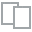
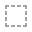
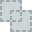
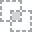
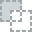
...
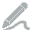
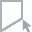
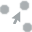
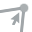
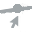

In [ ]:
#Διερευνητική ανάλυση δεδομένων (Exploratory Data Analysis - EDA)
create_report(vpn_traffic_df)

In [ ]:

#διαχωρισμός των δεδομένων σε σύνολα εκπαίδευσης (train) και δοκιμών (test)
train_size = int(0.8 * len(vpn_traffic_df))
train_df = vpn_traffic_df[:train_size]
test_df = vpn_traffic_df[train_size:]

In [ ]:
#Εκκίνηση της ρύθμισης του PyCaret με προεπεξεργασία δεδομένων
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from pycaret.regression import setup
darknet_df.replace([np.inf, -np.inf], np.nan, inplace=True)
reg_setup = setup(data=darknet_df, target='Flow_Duration', session_id=42,
                  normalize=True, transformation=True,
                  ignore_features=['proto'])

,Description,Value
0,Session id,42
1,Target,Flow_Duration
2,Target type,Regression
3,Original data shape,"(68580, 83)"
4,Transformed data shape,"(68580, 96)"
5,Transformed train set shape,"(48006, 96)"
6,Transformed test set shape,"(20574, 96)"
7,Ignore features,1
8,Numeric features,77
9,Categorical features,5


In [ ]:
#σύγκριση των διαθέσιμων μοντέλων ΜΜ
best = compare_models(cross_validation=False, n_select = 1)
%load_ext tensorboard

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
dt,Decision Tree Regressor,989867.5529,14673758028766.0801,3830634.1549,0.9911,1.2472,7.1444,10.0900
xgboost,Extreme Gradient Boosting,2302013.4637,17922564315751.1523,4233504.9682,0.9891,2.8523,892.0344,8.5000
rf,Random Forest Regressor,2276088.8622,18753576034728.3477,4330539.9242,0.9886,2.7115,825.3871,182.3900
gbr,Gradient Boosting Regressor,4124056.6583,34588900575125.2617,5881232.9128,0.9789,3.7335,1989.8219,67.2400
ada,AdaBoost Regressor,6318426.8321,48078639393774.4531,6933876.2171,0.9707,5.0981,27694.0555,35.9100
lightgbm,Light Gradient Boosting Machine,4754750.0482,53658706261260.9297,7325210.3220,0.9673,3.5498,2397.0426,9.2900
et,Extra Trees Regressor,4730979.3273,69437122119098.2812,8332893.9822,0.9577,2.6787,775.3787,98.9200
knn,K Neighbors Regressor,3697110.2670,134863117450852.7656,11613058.0577,0.9178,0.4565,1.3313,5.8400
br,Bayesian Ridge,11909713.7318,269535653677696.8125,16417541.0363,0.8358,4.9591,43808.4550,8.2400
lr,Linear Regression,11939131.9080,270505809414026.5938,16447060.8138,0.8352,4.9514,42905.4369,7.2600


Processing:   0%|          | 0/81 [00:00<?, ?it/s]

In [ ]:
#αναφορά των υπερπαραμέτρων του μοντέλου με την υψηλότερη απόδοση
print(best)

DecisionTreeRegressor(random_state=42)


In [ ]:
#μέτρα αξιολόγησης του μοντέλου με την υψηλότερη απόδοση
evaluate_model(best)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
#δημιουργία μοντέλου ανίχνευσης ανωμαλιών Isolation Forest
iforest = IForest(contamination=0.1)
iforest.fit(train_df[['Flow_Duration']])


IForest(behaviour='old', bootstrap=False, contamination=0.1, max_features=1.0,
    max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
    verbose=0)

In [ ]:
#πίνακας προβλέψεων με ανωμαλίες στο σύνολο δοκιμών
test_df['anomaly'] = iforest.predict(test_df[['Flow_Duration']])

In [ ]:
#δημιουργία νέας στήλης 'Label' με βάση το αποτέλεσμα του ελέγχου ανίχνευσης ανωμαλιών
test_df['Label'] = test_df['anomaly'].apply(lambda x: 'Anomaly' if x == 1 else 'Normal')

In [ ]:
#εκτύπωση των ανωμαλιών
print("Ανωμαλίες στο Test Set:")
print(test_df[test_df['anomaly'] == 1][['Flow_Duration', 'Label']])

Ανωμαλίες στο Test Set:
       Flow_Duration    Label
63198      114504265  Anomaly
63212       97468864  Anomaly
63214       97795801  Anomaly
63227      104751516  Anomaly
63234      117968456  Anomaly
...              ...      ...
68029       83981936  Anomaly
68032       83985866  Anomaly
68168      111299506  Anomaly
68296       42009327  Anomaly
68508      115015979  Anomaly

[189 rows x 2 columns]


In [ ]:
#κατανομή των προβλέψεων για το σύνολο δοκιμών
total_test_samples = len(test_df)
normal_test_samples = len(test_df[test_df['Label'] == 'Normal'])
anomaly_test_samples = len(test_df[test_df['Label'] == 'Anomaly'])

print(f"\nΣύνολο Δοκιμών (Test Set): {total_test_samples}")
print(f"Φυσιολογικές Προβλέψεις: {normal_test_samples}")
print(f"Ανώμαλες Προβλέψεις: {anomaly_test_samples}")
print(f"Ποσοστό Ανωμαλιών: {(anomaly_test_samples / total_test_samples) * 100:.2f}%")


Σύνολο Δοκιμών (Test Set): 2704
Φυσιολογικές Προβλέψεις: 2515
Ανώμαλες Προβλέψεις: 189
Ποσοστό Ανωμαλιών: 6.99%
